---
title: "Tablero de Indicadores Mundiales"
author: ""
format:
  html:
    theme: cosmo         
    toc: true             
    toc-location: left
    page-layout: full     # Ancho total
    #code-fold: true       #permite ver el código si le dan clic
    echo: false           # Oculta el código por defecto en todo el reporte
    css: styles.css       
jupyter: python3
---

<div class="indicadores-box">
# Análisis de la tasa de fertilidad total mundial
</div>

<div class="indicadores-box">

##  Indicadores Demográficos y Socioeconómicos

| Indicador | Descripción |
|:-----------|:-------------|
|  **Tasa de Fertilidad Total (TFR)** | Promedio de hijos que tendría una mujer durante su vida fértil. |
|  **Ingreso per cápita (GDP)** | Valor promedio de los ingresos de una persona en un país o región. |
|  **Nivel de Educación (EDU)** | Promedio de años de escolaridad o nivel educativo alcanzado. |
|  **Esperanza de Vida al Nacer (LEB)** | Promedio de años que se espera que viva una persona desde su nacimiento. |

</div>


In [1]:
#| echo: false

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 
from math import ceil


In [2]:
#| echo: false

TFR = pd.read_csv('UNdata_Export_20230621_205538168.zip')
# GPD per capita
GDP = pd.read_csv('UNdata_Export_20230624_011417717.zip')
# Life expectancy at birth 
LEB = pd.read_csv('UNdata_Export_20230624_013747471.zip')
# Gross enrolment ratio. Tertiary education
EDU = pd.read_csv('UNdata_Export_20230624_014454110.zip')

In [3]:
#| echo: false
TFR = TFR.rename(columns={
    "Country or Area": "Country or Area",
    "Year(s)": "Year",
    "Variant": "Variant",
    "Value": "Value"
})

GDP = GDP.rename(columns={
    "Country or Area": "Country or Area",
    "Year": "Year",
    "Item": "Variant",
    "Value": "Value"
})

EDU = EDU.rename(columns={
    "Reference Area": "Country or Area",
    "Time Period": "Year",
    "Sex": "Variant",
    "Age group": "Age group",
    "Units of measurement": "Units",
    "Observation Value": "Value"
})

LEB = LEB.rename(columns={
    "Country or Area": "Country or Area",
    "Year(s)": "Year",
    "Variant": "Variant",
    "Value": "Value"
})

print(TFR.columns)
print(GDP.columns)
print(EDU.columns)
print(LEB.columns)

Index(['Country or Area', 'Year', 'Variant', 'Value'], dtype='object')
Index(['Country or Area', 'Year', 'Variant', 'Value'], dtype='object')
Index(['Country or Area', 'Year', 'Variant', 'Age group', 'Units', 'Value'], dtype='object')
Index(['Country or Area', 'Year', 'Variant', 'Value'], dtype='object')


In [4]:
#| echo: false

TFR_group = TFR.groupby('Country or Area')
GDP_group = GDP.groupby('Country or Area')
LEB_group = LEB.groupby('Country or Area')
EDU_group = EDU.groupby('Country or Area')

In [5]:
#| echo: false
#| eval: false

TFR_countries = TFR_group.groups.keys()
GDP_countries = GDP_group.groups.keys()
LEB_countries = LEB_group.groups.keys()
EDU_countries = EDU_group.groups.keys()

In [6]:
#| include: false


print(len(TFR_countries))
print(len(GDP_countries))
print(len(LEB_countries))
print(len(EDU_countries))

284
220
284
220


In [7]:
#| echo: false
#| eval: false
filtra_GDP = lambda p: p in GDP_countries
filtra_LEB = lambda p: p in LEB_countries
filtra_EDU = lambda p: p in EDU_countries

In [8]:
#| include: false

countries = list(filter(filtra_EDU, list(filter(filtra_GDP, list(filter(filtra_LEB, TFR_countries))))))

## Visualización previa
A continuación se presenta una primera aproximación a la información, mediante cuatro gráficas que ilustran los Indicadores Demográficos y Socioeconómicos.


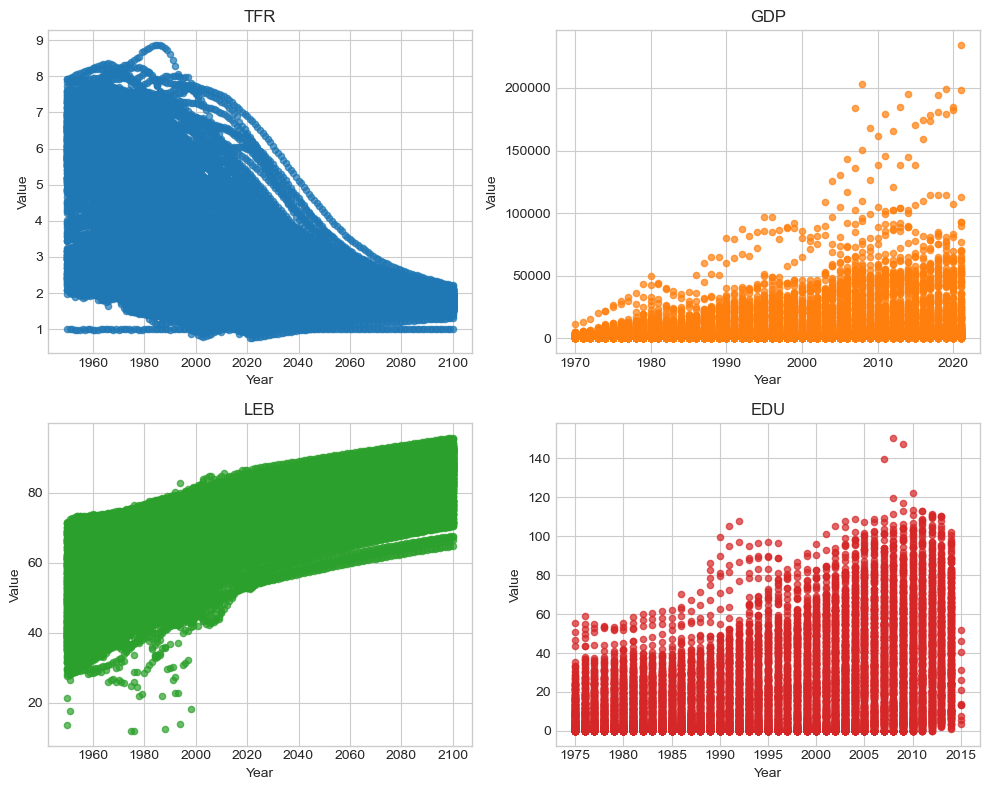

In [9]:
#| echo: false
plt.style.use('seaborn-v0_8-whitegrid')

fig = plt.figure(figsize=(10, 8), facecolor='none')

ax1 = plt.subplot(221)
TFR.plot(x='Year', y='Value', kind='scatter', marker='o', c='tab:blue', alpha=0.7, ax=ax1)
ax1.set_title('TFR')

ax2 = plt.subplot(222)
GDP.plot(x='Year', y='Value', kind='scatter', marker='o', c='tab:orange', alpha=0.7, ax=ax2)
ax2.set_title('GDP')

ax3 = plt.subplot(223)
LEB.plot(x='Year', y='Value', kind='scatter', marker='o', c='tab:green', alpha=0.7, ax=ax3)
ax3.set_title('LEB')

ax4 = plt.subplot(224)
EDU.plot(x='Year', y='Value', kind='scatter', marker='o', c='tab:red', alpha=0.7, ax=ax4)
ax4.set_title('EDU')

plt.tight_layout()
plt.savefig('TFR_01.png', dpi=300, transparent=True)
plt.show()

# Graficas  

::: {.panel-tabset}

In [10]:
#| include: false
print(f'Columnas de TFR= {TFR.columns}')
print(f'Columnas de GDP= {GDP.columns}')
print(f'Columnas de LEB= {LEB.columns}')
print(f'Columnas de EDU= {EDU.columns}')

Columnas de TFR= Index(['Country or Area', 'Year', 'Variant', 'Value'], dtype='object')
Columnas de GDP= Index(['Country or Area', 'Year', 'Variant', 'Value'], dtype='object')
Columnas de LEB= Index(['Country or Area', 'Year', 'Variant', 'Value'], dtype='object')
Columnas de EDU= Index(['Country or Area', 'Year', 'Variant', 'Age group', 'Units', 'Value'], dtype='object')


In [11]:
#| include: false
TFR['Variant'].unique()

array(['Medium'], dtype=object)

## Gráfica 1
### Lo primero que podemos ver es cómo han evolucionado estas variables a lo largo del tiempo.
### Selecciona una variable y uno o el conjunto de países a destacar.

In [12]:
#| echo: false
#| column: screen-inset
import plotly.graph_objects as go
import pandas as pd

# 1. Diccionario de países y colores
destacados = {
    'Niger': 'darkred', 'Central African Republic': 'red',
    'Burundi': 'orangered', 'Malawi': 'darkorange',
    'Yemen': 'limegreen', 'Mexico': 'forestgreen',
    'Cuba': 'dodgerblue', 'Liechtenstein': 'royalblue',
    'Japan': 'mediumblue', 'World': 'black',
    'Germany': 'purple', 'United States of America': 'firebrick'
}

def crear_interactividad_total(datasets, destacados):
    # Estandarizar nombres de columnas para cada dataframe
    datos_listos = {}
    for nombre, df in datasets.items():
        temp = df.copy()
        # Renombrar columnas de país
        if 'Country or Area' in temp.columns:
            temp = temp.rename(columns={'Country or Area': 'Country'})
        elif 'Reference Area' in temp.columns:
            temp = temp.rename(columns={'Reference Area': 'Country'})
            
        # Renombrar columnas de tiempo
        if 'Year(s)' in temp.columns:
            temp = temp.rename(columns={'Year(s)': 'Year'})
        elif 'Time Period' in temp.columns:
            temp = temp.rename(columns={'Time Period': 'Year'})
            
        # Renombrar columnas de valor
        if 'Observation Value' in temp.columns:
            temp = temp.rename(columns={'Observation Value': 'Value'})
            
        # Filtrar y ordenar
        temp = temp[temp['Year'] <= 2022].sort_values(['Country', 'Year'])
        datos_listos[nombre] = temp

    # Variables iniciales
    nombre_inicial = list(datos_listos.keys())[0]
    df_init = datos_listos[nombre_inicial]
    paises_dest = list(destacados.keys())
    
    fig = go.Figure()

    # Traza 0: Fondo Gris (Todos los países)
    x_f, y_f = [], []
    for p in df_init['Country'].unique():
        d = df_init[df_init['Country'] == p]
        x_f.extend(d['Year'].tolist() + [None])
        y_f.extend(d['Value'].tolist() + [None])
    
    fig.add_trace(go.Scatter(x=x_f, y=y_f, mode='lines', 
                             line=dict(color='#e5e5e5', width=1), 
                             hoverinfo='skip', name='Otros'))

    # Trazas 1-N: Países destacados
    for pais in paises_dest:
        d = df_init[df_init['Country'] == pais]
        fig.add_trace(go.Scatter(x=d['Year'], y=d['Value'], mode='lines',
                                 line=dict(color=destacados[pais], width=2.5),
                                 name=pais))

    # Configuración de botones para cambiar de Variable
    botones_var = []
    for nombre, df in datos_listos.items():
        nuevas_x, nuevas_y = [], []
        # Actualizar datos del fondo
        xf, yf = [], []
        for p in df['Country'].unique():
            d = df[df['Country'] == p]
            xf.extend(d['Year'].tolist() + [None])
            yf.extend(d['Value'].tolist() + [None])
        nuevas_x.append(xf)
        nuevas_y.append(yf)
        # Actualizar datos de destacados
        for p in paises_dest:
            d = df[df['Country'] == p]
            nuevas_x.append(d['Year'] if not d.empty else [None])
            nuevas_y.append(d['Value'] if not d.empty else [None])
            
        botones_var.append(dict(
            method='update', label=nombre,
            args=[{'x': nuevas_x, 'y': nuevas_y}, {'title': f'Indicador: {nombre}'}]
        ))

    # Configuración de botones para filtrar por País
    botones_pais = [dict(method='restyle', label='Mostrar Todos', args=[{'visible': True}])]
    for i, pais in enumerate(paises_dest):
        vis = [False] * len(fig.data)
        vis[0] = True # Fondo siempre visible
        vis[i+1] = True # Pais seleccionado
        botones_pais.append(dict(method='restyle', label=pais, args=[{'visible': vis}]))

    # Diseño del gráfico
    fig.update_layout(
        template='plotly_white', height=700, autosize=True,
        margin=dict(t=120, b=100, l=50, r=50),
        updatemenus=[
            dict(active=0, buttons=botones_var, x=0, y=1.18, xanchor='left', yanchor='top'),
            dict(active=0, buttons=botones_pais, x=1, y=1.18, xanchor='right', yanchor='top')
        ],
        legend=dict(orientation='h', y=-0.15, x=0.5, xanchor='center')
    )

    fig.show(config={'responsive': True})

# Ejecución
datasets = {
    'Fertilidad (TFR)': TFR,
    'PIB (GDP)': GDP,
    'Educación (EDU)': EDU,
    'Esperanza de Vida (LEB)': LEB
}

crear_interactividad_total(datasets, destacados)

## Gráfica 2
### Podemos ver la correlación entre la esperanza de vida y la tasa de fertilidad en mujeres, avanzando por los años.

In [13]:
#| echo: false
#| column: screen-inset
import plotly.graph_objects as go
import pandas as pd

# 1. Definir destacados y colores
destacados_corr = {
    'Niger': 'darkred', 'Central African Republic': 'red',
    'Burundi': 'orangered', 'Malawi': 'darkorange',
    'Yemen': 'limegreen', 'Mexico': 'forestgreen',
    'Cuba': 'dodgerblue', 'Liechtenstein': 'royalblue',
    'Japan': 'mediumblue', 'World': 'black'
}

# 2. Cruce de datos (Merge)
# Unimos por país y año para que cada punto tenga ambos valores
df_corr = pd.merge(
    TFR[['Country or Area', 'Year', 'Value']].rename(columns={'Value': 'TFR'}),
    LEB[['Country or Area', 'Year', 'Value']].rename(columns={'Value': 'LEB'}),
    on=['Country or Area', 'Year']
).dropna()

paises_validos = df_corr['Country or Area'].unique()

fig = go.Figure()

# 3. Fondo Gris (Contexto global - Todos los años y países)
fig.add_trace(go.Scatter(
    x=df_corr['LEB'], y=df_corr['TFR'],
    mode='markers',
    marker=dict(color='#e5e5e5', size=5, opacity=0.3),
    hoverinfo='skip',
    name='Otros países'
))

# 4. Trayectorias de Países Destacados
for pais, color in destacados_corr.items():
    if pais in paises_validos:
        d = df_corr[df_corr['Country or Area'] == pais].sort_values('Year')
        fig.add_trace(go.Scatter(
            x=d['LEB'], y=d['TFR'],
            mode='lines+markers',
            line=dict(color=color, width=2),
            marker=dict(size=6),
            name=pais,
            text=d['Year'], # El año aparece al pasar el mouse
            hovertemplate='<b>' + pais + '</b><br>Año: %{text}<br>Esp. Vida: %{x:.1f}<br>Fertilidad: %{y:.2f}<extra></extra>'
        ))

# 5. Menú interactivo de selección
botones = [dict(method='restyle', label='Mostrar Todos', args=[{'visible': True}])]

for i, pais in enumerate(destacados_corr.keys()):
    if pais in paises_validos:
        # Visibilidad: Fondo (0) siempre True + el país seleccionado
        vis = [False] * len(fig.data)
        vis[0] = True
        # Buscamos el índice de la traza del país
        for idx, trace in enumerate(fig.data):
            if trace.name == pais:
                vis[idx] = True
        
        botones.append(dict(
            method='restyle', label=pais,
            args=[{'visible': vis}]
        ))

# 6. Diseño final
fig.update_layout(
    title='Correlación: Esperanza de Vida vs Tasa de Fertilidad',
    xaxis_title='Esperanza de Vida (Años)',
    yaxis_title='Tasa de Fertilidad (Hijos por mujer)',
    template='plotly_white',
    height=700,
    autosize=True,
    margin=dict(t=100, b=100, l=60, r=60),
    updatemenus=[dict(
        active=0,
        buttons=botones,
        direction="down",
        x=1.02, xanchor="left",
        y=1, yanchor="top"
    )],
    legend=dict(
        orientation="h",
        yanchor="top", y=-0.15,
        xanchor="center", x=0.5
    )
)

# Mostrar con responsividad para ancho del 90%
fig.show(config={'responsive': True})

## Gráfica 3
### Podemos ver un mapa de cómo evoluciona la tasa de fertilidad  a lo largo de los años en cada país.

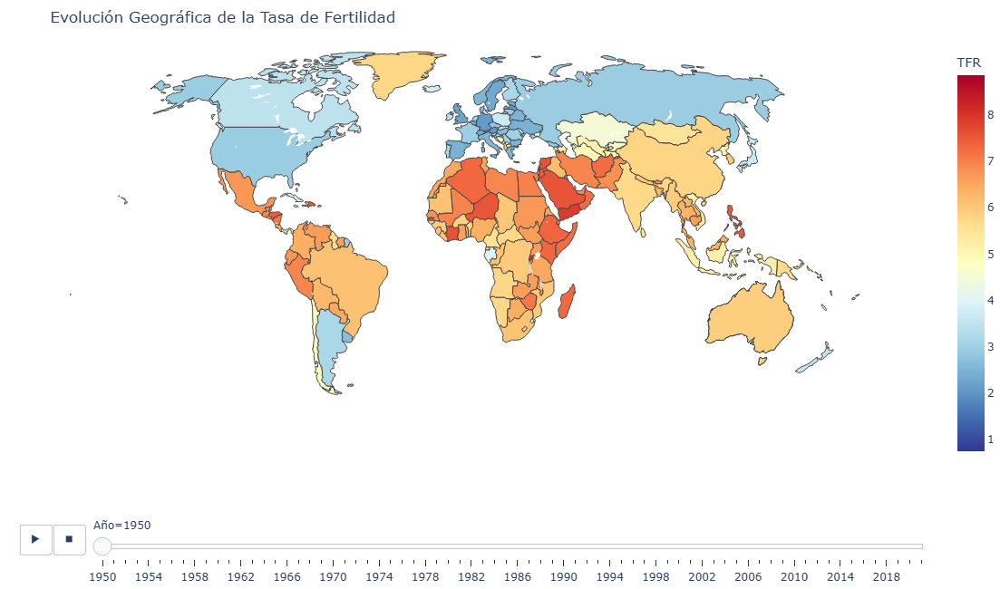

In [14]:
#| column: screen-inset
import plotly.express as px

# 1. Preparamos datos sin renombrar
df_mapa = TFR.copy()
# Filtramos y ordenamos usando los nombres de columna originales
df_mapa = df_mapa[df_mapa['Year'] <= 2021].sort_values('Year')

# 2. Crear el mapa
fig = px.choropleth(
    df_mapa,
    locations="Country or Area",       
    locationmode="country names", 
    color="Value",                    
    hover_name="Country or Area",      
    animation_frame="Year",         
    color_continuous_scale="RdYlBu_r", 
    range_color=[df_mapa['Value'].min(), df_mapa['Value'].max()], 
    title="Evolución Geográfica de la Tasa de Fertilidad",
    labels={'Value': 'TFR', 'Year': 'Año', 'Country or Area': 'País'}
)

# 3. Ajustes de estilo
fig.update_layout(
    template='plotly_white',
    height=650,
    margin=dict(t=50, b=50, l=0, r=0),
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='natural earth'
    )
)

fig.show(config={'responsive': True})

:::